# Chicago crimes dataset

Firstly, i extracted the a portion of 16,000 rows of data from google cloud platform, to work locally.
i used the following query to extract the data:

In [1]:
%%capture
'''
  SELECT 
    CAST(date AS STRING FORMAT 'YYYY') AS year,
    CAST(date AS STRING FORMAT 'MONTH') AS month,
    primary_type description ,
    location_description ,
    domestic,
    latitude,
    longitude,
    arrest,
  FROM `bigquery-public-data.chicago_crime.crime` 
  ORDER BY RAND()
  LIMIT 16000
'''

In [2]:
#REMARK: you might want to pip install folium in order to run the chicago map
# !pip install folium

In [3]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import warnings
warnings.filterwarnings("ignore")

In [4]:
df = pd.read_csv('crimes.csv')
df.dropna(inplace = True) # drop NAN rows
df

,year,month,description,location_description,domestic,latitude,longitude,arrest
0,2004,FEBRUARY,NARCOTICS,STREET,False,41.898435,-87.690141,True
1,2010,SEPTEMBER,NARCOTICS,"SCHOOL, PUBLIC, BUILDING",False,41.946725,-87.691501,True
2,2021,MARCH,ASSAULT,APARTMENT,True,41.953130,-87.771139,False
3,2014,SEPTEMBER,CRIMINAL DAMAGE,RESIDENCE-GARAGE,False,41.966759,-87.775976,False
4,2017,MAY,BATTERY,ALLEY,True,41.865533,-87.709301,False
...,...,...,...,...,...,...,...,...
15995,2004,MAY,BURGLARY,RESIDENCE-GARAGE,False,41.774995,-87.687193,False
15996,2018,FEBRUARY,CRIMINAL DAMAGE,STREET,False,41.812817,-87.693119,False
15997,2012,JUNE,BATTERY,OTHER,False,41.786258,-87.702627,False
15998,2012,MARCH,OTHER OFFENSE,RESIDENCE,True,41.917601,-87.749828,False


Now, lets use the geographical attributes of the dataset and plot the crimes accordingly:

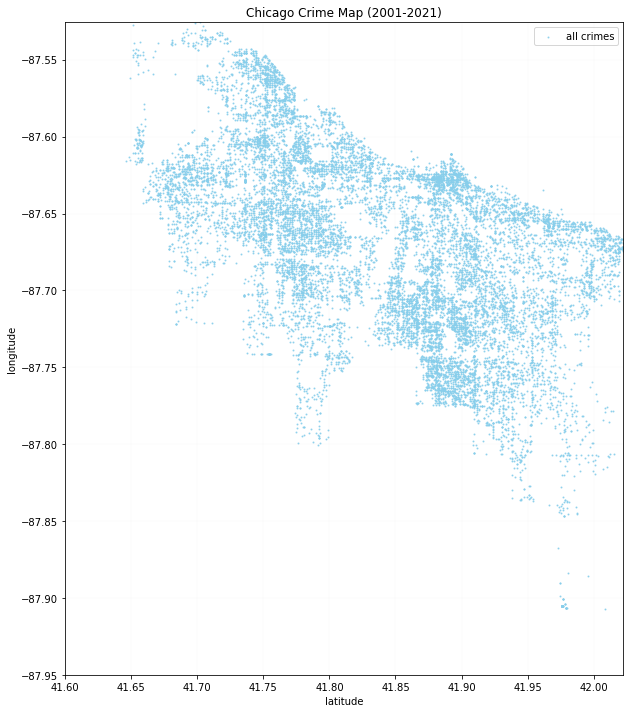

In [5]:
fig,ax= plt.subplots(1, 1, figsize=(10,12))
x_min = df.latitude.min(); x_max = df.latitude.max()
y_min = df.longitude.min() ; y_max = df.longitude.max()
plt.xlim(41.6,x_max) 
plt.ylim(-87.95,y_max) 

# plot thefts, homicides, kidnappings and sexual assaults
ax.scatter(df['latitude'], df['longitude'], s=1, alpha=0.8, color='skyblue', label='all crimes')
plt.xlabel('latitude')
plt.ylabel('longitude')
plt.title(f'Chicago Crime Map ({df.year.min()}-{df.year.max()})')
plt.legend(loc='upper right', frameon=True)
plt.grid(linestyle = '--', linewidth = 0.05)
plt.show()

Now, lets make it even more interesting:
    lets split the data accordingt to arrested and not arrested crimes, and plot them over the chicago map:

In [6]:
chicago_map = folium.Map(location=[41.864073,-87.706819],
                        zoom_start=11,
                        tiles="CartoDB positron")
group0 = folium.FeatureGroup(name='<span style=\\"color: green;\\">Not Arrested - Green</span>')
df[df['arrest'] == False].apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude"]], 
                                              radius=0.5, color='green')
                                             .add_to(group0), axis=1)
group0.add_to(chicago_map)

group1 = folium.FeatureGroup(name='<span style=\\"color: red;\\">Arrested - Red</span>')
df[df['arrest'] == True].apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude"]], 
                                              radius=0.5, color='red')
                                             .add_to(group1), axis=1)
group1.add_to(chicago_map)


folium.map.LayerControl('topright', collapsed=False).add_to(chicago_map)
chicago_map

Now, lets explore the crimes type and locations:

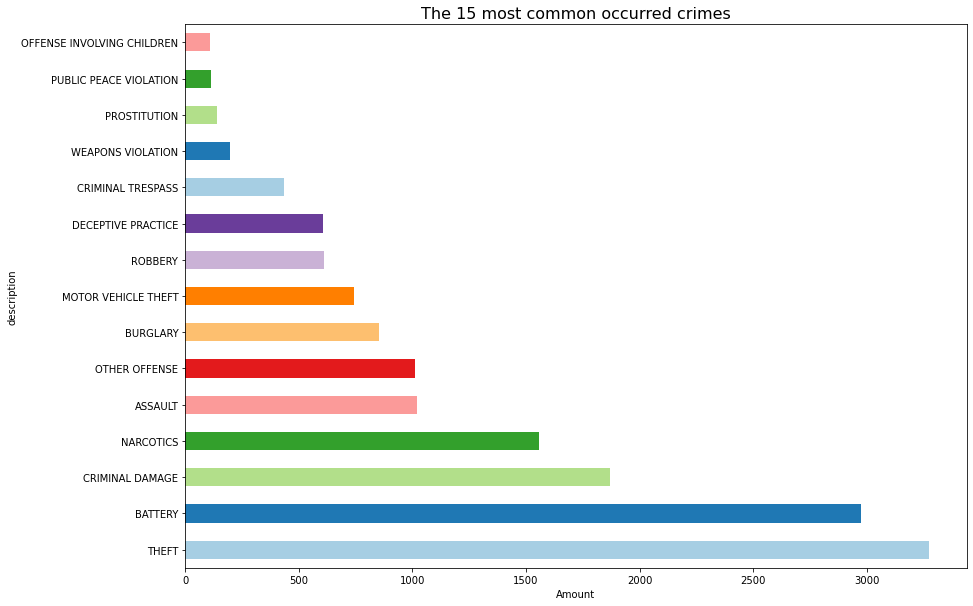

In [7]:
plt.figure(figsize=(14,10))
plt.title('The 15 most common occurred crimes',fontsize = 16)
plt.xlabel('Amount')
df.groupby([df['description']]).size().sort_values(ascending=False).head(15).plot(kind='barh',color=plt.cm.Paired(np.arange(10)))
plt.show()

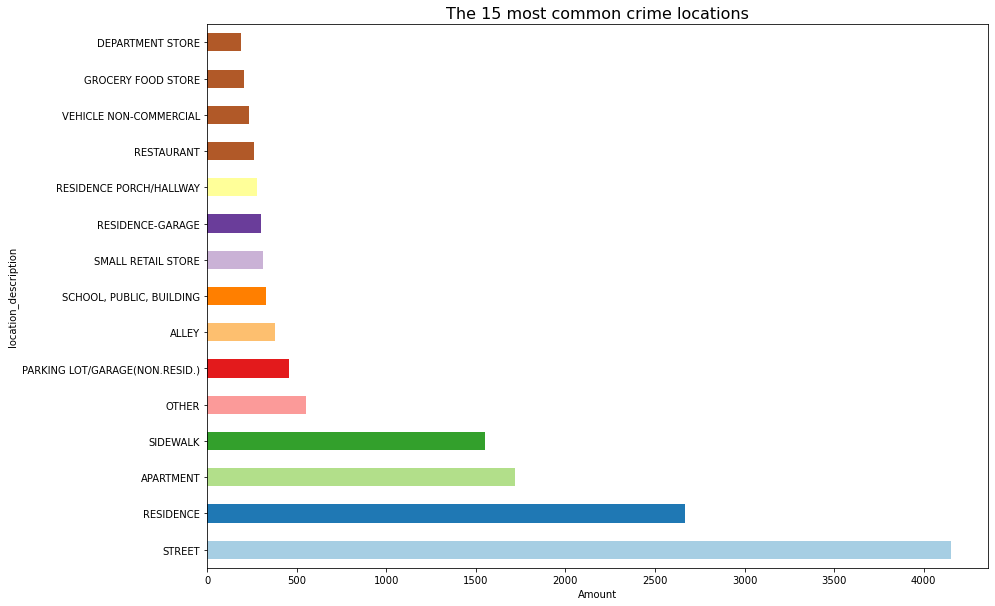

In [8]:
plt.figure(figsize=(14,10))
plt.title('The 15 most common crime locations',fontsize = 16)
plt.xlabel('Amount')
df.groupby([df['location_description']]).size().sort_values(ascending=False).head(15).plot(kind='barh',color=plt.cm.Paired(np.arange(20)))

In [9]:
top5_crimes = df.groupby([df['description']]).size().sort_values(ascending=False).head(5).index.values 
top5_crimes = df[df['description'].isin(top5_crimes)]
top5_crimes= top5_crimes.groupby(['description','location_description']).size().rename('Count')
top5_crimes = top5_crimes.unstack()
top5_crimes= top5_crimes.fillna(0)

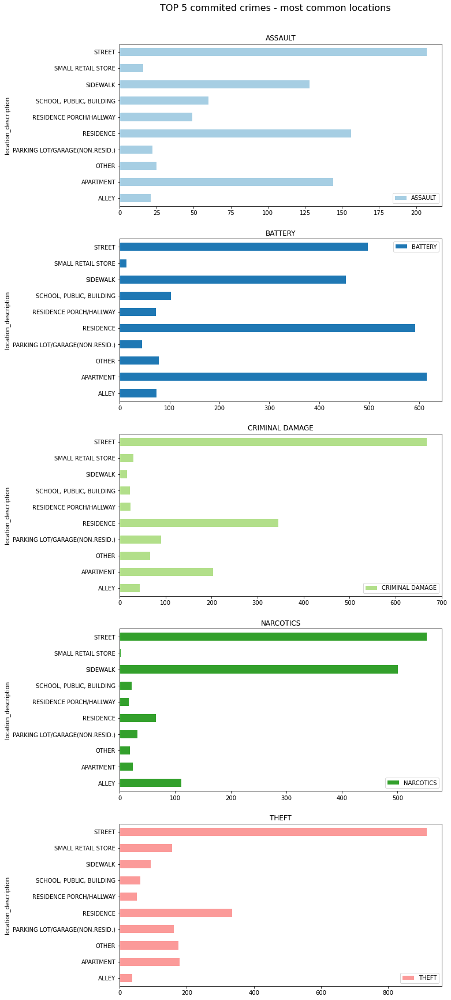

In [10]:
top5_crimes = top5_crimes.iloc[::,np.where(top5_crimes.sum(axis = 0)>200)[0]]
top5_crimes.T.plot(kind= 'barh',subplots=True, layout=(-1, 1), figsize=(10, 30), sharex=False,color=plt.cm.Paired(np.arange(top5_crimes.shape[1])))
plt.suptitle('TOP 5 commited crimes - most common locations',y=0.912,fontsize = 16)
plt.show()

Now that we filtered the most common crimes. lets inspect their rise/fall throughout the years:

In [11]:
crimes_pop = df.groupby([df['description']]).size().sort_values(ascending=False).head(15).index.values 
pop_cr = df[df['description'].isin(crimes_pop)]
a = pop_cr.groupby(['year','description']).size().rename('Count')
a = a.unstack()

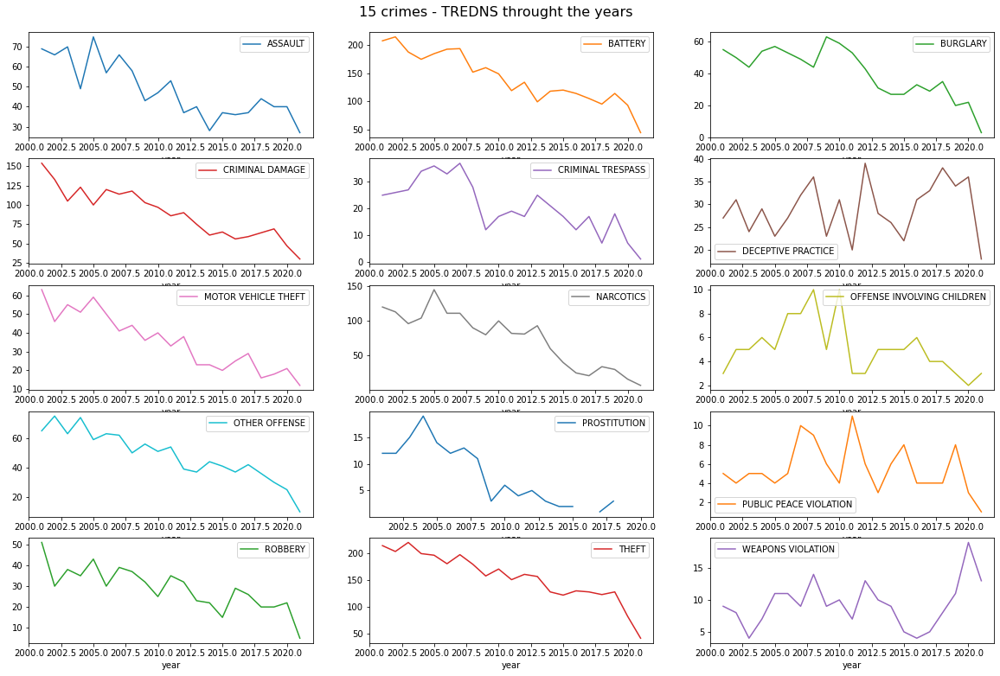

In [12]:
a.plot(subplots=True, layout=(-1, 3), figsize=(20, 13), sharex=False)
plt.suptitle('15 crimes - TREDNS throught the years',fontsize = 16,y=0.912)
plt.show()

Now lets see how many arrests were made for each common crime out of the 15

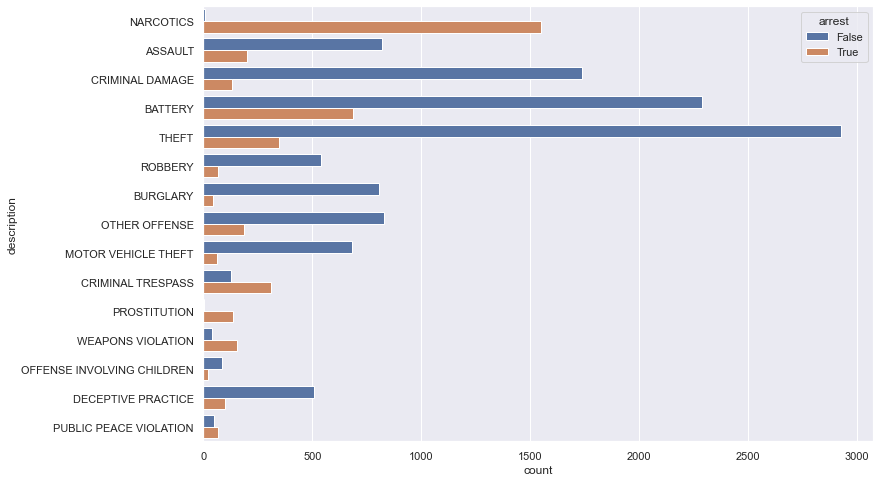

In [13]:
sns.set(rc={'figure.figsize':(12,8)})
sns.countplot(y='description',hue='arrest',data=pop_cr)
plt.show()

What about the proportion between crimes made and arrests throughout the years?

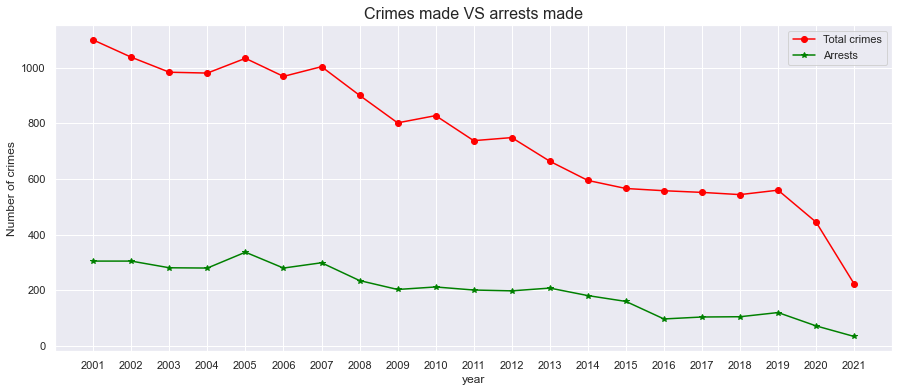

In [14]:
df.groupby(['year'])['arrest'].count().plot(legend=True,label='Total crimes',marker='o',color = 'red',figsize=(15,6))
df[df['arrest']==True].groupby(['year'])['arrest'].count().plot(legend=True,label='Arrests',marker='*',color = 'green')
plt.title('Crimes made VS arrests made',fontsize = 16)
plt.ylabel('Number of crimes')
plt.xticks(np.arange(df.year.min(),df.year.max()+1))
plt.show()

And another plot of crimes according to months:

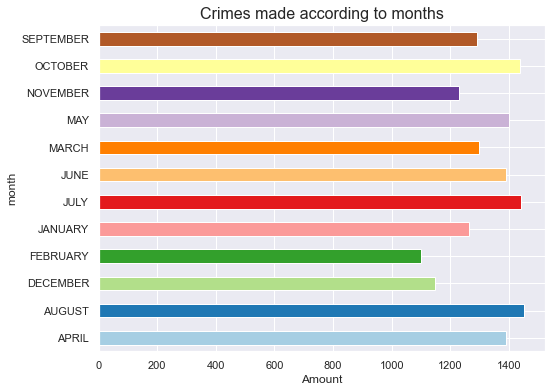

In [15]:
df.groupby(['month'])['arrest'].count().plot(kind = 'barh',figsize=(8,6),color=plt.cm.Paired(np.arange(12)))
plt.xlabel('Amount')
plt.title('Crimes made according to months',fontsize = 16)
plt.show()

** The visualization can go on and on with more grouping and joins and many many more ideas...**

## Applying learning algorithm on data - Arrest prediction

Thus far, i've visualized the exctracted data. now ill apply a machine learning classification algorithm. the learning concept which will be used is $$ Logistic \space Regression $$
The learning algorithm will accept the data above, as a training data. the learning output will be the ability to predict for a given instance of crime - wheter an arrest has been made, based on the occured crimes in the training dataset above

Lets do some preprocessing before starting applying the learner. the arrest feature will be turned in a binary classification feature:
$$
     class = \left\{
    \begin{array}\\
        1 & \mbox{Arrest }  \\
        0 & \mbox{No arrest } \\
    \end{array}
\right.
$$

In [16]:
#Precprocessing
df['class'] = df['arrest'].apply(lambda x: 1 if x  else 0)
df.drop(columns=['arrest'],inplace = True)
df

,year,month,description,location_description,domestic,latitude,longitude,class
0,2004,FEBRUARY,NARCOTICS,STREET,False,41.898435,-87.690141,1
1,2010,SEPTEMBER,NARCOTICS,"SCHOOL, PUBLIC, BUILDING",False,41.946725,-87.691501,1
2,2021,MARCH,ASSAULT,APARTMENT,True,41.953130,-87.771139,0
3,2014,SEPTEMBER,CRIMINAL DAMAGE,RESIDENCE-GARAGE,False,41.966759,-87.775976,0
4,2017,MAY,BATTERY,ALLEY,True,41.865533,-87.709301,0
...,...,...,...,...,...,...,...,...
15995,2004,MAY,BURGLARY,RESIDENCE-GARAGE,False,41.774995,-87.687193,0
15996,2018,FEBRUARY,CRIMINAL DAMAGE,STREET,False,41.812817,-87.693119,0
15997,2012,JUNE,BATTERY,OTHER,False,41.786258,-87.702627,0
15998,2012,MARCH,OTHER OFFENSE,RESIDENCE,True,41.917601,-87.749828,0


In [17]:
from sklearn.compose import ColumnTransformer
from sklearn.datasets import fetch_openml
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

In [18]:
X,y = df.iloc[:,0:7], df['class'].values

In [19]:
numeric_features = ['year', 'latitude','latitude']
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_features = ['month', 'description', 'location_description','domestic']
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Append classifier to preprocessing pipeline.
# Now we have a full prediction pipeline.
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', LogisticRegression())])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=0)

clf.fit(X_train, y_train)
print("model training score: %.3f" % clf.score(X_test, y_test))

model training score: 0.870


Now, i queried the data once again to get different sample of the dataset and to apply the model on this data to witness the results

In [20]:
#Precprocessing test data
test = pd.read_csv('test2.csv')
test.dropna(inplace = True) # drop NAN rows
test['class'] = test['arrest'].apply(lambda x: 1 if x  else 0)
test.drop(columns=['arrest'],inplace = True)
test

,year,month,description,location_description,domestic,latitude,longitude,class
0,2013,MARCH,BATTERY,OTHER,False,41.902443,-87.740382,1
1,2004,AUGUST,BATTERY,RESIDENCE,False,41.829554,-87.696027,0
2,2007,MAY,THEFT,"SCHOOL, PUBLIC, BUILDING",False,42.021178,-87.672208,0
3,2010,JANUARY,BATTERY,SIDEWALK,False,41.989727,-87.658203,0
4,2003,APRIL,NARCOTICS,STREET,False,41.862916,-87.709583,1
...,...,...,...,...,...,...,...,...
15995,2003,APRIL,BATTERY,RESIDENCE,True,41.708301,-87.641654,0
15996,2001,APRIL,CRIMINAL DAMAGE,RESIDENCE,False,41.714533,-87.570503,0
15997,2015,NOVEMBER,BURGLARY,RESIDENCE,False,41.758156,-87.568802,0
15998,2013,JANUARY,THEFT,SMALL RETAIL STORE,False,41.886040,-87.624522,1


In [21]:
X_t,y_t = test.iloc[:,0:7], test['class'].values
clf.score(X_t,y_t)
print("Testing accuracy score: %.3f" % clf.score(X_t,y_t))

Testing accuracy score: 0.863


**We result in similar accuracy for the test data and the validation data which was used to validate to training model.**